In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Path: 02notebook\02EDA.ipynb
df_transaction = pd.read_parquet('../01data/02preprocessed/01parquet/df_train.parquet')

In [2]:
# Import necessary modules
import pandas as pd
import numpy as np
from scipy import fftpack
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy import stats

# Load the data
df = df_transaction.copy()

# Convert 'fecha_compra' to datetime format
df['fecha_compra'] = pd.to_datetime(df['fecha_compra'])

# Set 'fecha_compra' as the index
df.set_index('fecha_compra', inplace=True)

# Define a function to calculate the metrics for each customer
def calculate_metrics(df):
    # Resample the data to get the total orders for each customer each week
    df_resampled = df.resample('W').sum()

    # If the resampled data is empty, return NaNs
    if df_resampled.empty:
        return pd.Series([np.nan for _ in range(17)], 
                         index=['trend', 'variability', 'num_weeks', 'skewness', 'kurtosis', 
                                'autocorr_lag1', 'autocorr_lag2', 'max_peak'] + 
                               ['avg_orders_weekday' + str(i) for i in range(7)] + 
                               ['avg_orders_week_of_month' + str(i) for i in range(4)])

    # Calculate the trend as the slope of a linear regression fit to the data
    x = np.arange(len(df_resampled))
    if np.all(df_resampled.values == df_resampled.values[0]):  # if all values are equal
        trend = np.nan
        residuals = np.nan
    else:
        coefficients = np.polyfit(x, df_resampled.values, 1)
        trend = coefficients[0][0]
        residuals = df_resampled.values - np.polyval(coefficients, x)

    # Calculate the variability as the standard deviation of the residuals from the trend
    variability = np.nan if np.isnan(residuals).all() else np.nanstd(residuals)

    # Calculate the number of weeks
    num_weeks = len(df_resampled)

    # Calculate skewness and kurtosis
    skewness = stats.skew(df_resampled)[0]
    kurtosis = stats.kurtosis(df_resampled)[0]

    # Calculate autocorrelation for lag 1 and 2
    autocorr_lag1 = df_resampled[df_resampled.columns[0]].autocorr(lag=1)
    autocorr_lag2 = df_resampled[df_resampled.columns[0]].autocorr(lag=2)

    # Calculate maximum peak
    max_peak = max(df_resampled['cantidad_venta'])

    # Calculate the average orders for each day of the week
    weekdays = df_resampled.index.weekday
    avg_orders_weekday = [df_resampled['cantidad_venta'][weekdays == i].mean() 
                            if not np.isnan(df_resampled['cantidad_venta'][weekdays == i].mean()) else 0 
                            for i in range(7)]

    # Calculate the average orders for each week of the month
    weeks_of_month = df_resampled.index.week // 4
    avg_orders_week_of_month = [df_resampled['cantidad_venta'][weeks_of_month == i].mean() 
                                if not np.isnan(df_resampled['cantidad_venta'][weeks_of_month == i].mean()) else 0 
                                for i in range(4)]

    return pd.Series([trend, variability, num_weeks, skewness, kurtosis, 
                      autocorr_lag1, autocorr_lag2, max_peak] + avg_orders_weekday + avg_orders_week_of_month, 
                     index=['trend', 'variability', 'num_weeks', 'skewness', 'kurtosis', 
                            'autocorr_lag1', 'autocorr_lag2', 'max_peak'] + 
                           ['avg_orders_weekday' + str(i) for i in range(7)] + 
                           ['avg_orders_week_of_month' + str(i) for i in range(4)])

# Calculate the metrics for each customer
metrics = df[['customer_id','cantidad_venta']].groupby('customer_id').apply(calculate_metrics)

<ipython-input-2-391cc68525c6>:21: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_resampled = df.resample('W').sum()
<ipython-input-2-391cc68525c6>:65: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weeks_of_month = df_resampled.index.week // 4
<ipython-input-2-391cc68525c6>:21: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_resampled = df.resample('W').sum()
<ipython-input-2-391cc68525c6>:6

In [5]:
metrics.head()

,trend,variability,num_weeks,skewness,kurtosis,autocorr_lag1,autocorr_lag2,max_peak,avg_orders_weekday0,avg_orders_weekday1,avg_orders_weekday2,avg_orders_weekday3,avg_orders_weekday4,avg_orders_weekday5,avg_orders_weekday6,avg_orders_week_of_month0,avg_orders_week_of_month1,avg_orders_week_of_month2,avg_orders_week_of_month3
customer_id,,,,,,,,,,,,,,,,,,,
1,-0.444250,36.569506,52.0,2.055159,8.035087,0.082961,0.141570,238.0,0.0,0.0,0.0,0.0,0.0,0.0,64.673077,58.000000,58.00,69.25,60.00
10,0.033624,19.354914,53.0,1.371473,1.274396,-0.262446,-0.099713,80.0,0.0,0.0,0.0,0.0,0.0,0.0,13.622642,10.666667,23.40,5.50,5.25
100,-0.242893,19.781962,52.0,2.107958,5.355652,-0.009359,-0.031853,96.0,0.0,0.0,0.0,0.0,0.0,0.0,21.038462,24.333333,23.00,28.75,39.00
1000,-0.398403,32.303215,53.0,0.892824,-0.199646,-0.040556,0.236152,116.0,0.0,0.0,0.0,0.0,0.0,0.0,33.415094,39.000000,22.80,28.75,27.00
10000,-0.056945,7.687092,52.0,2.135840,3.990745,-0.124896,-0.057954,33.0,0.0,0.0,0.0,0.0,0.0,0.0,4.153846,0.000000,8.75,4.50,0.00


In [4]:
metrics.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15312 entries, 1 to 9999
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   trend                      15281 non-null  float64
 1   variability                15281 non-null  float64
 2   num_weeks                  15312 non-null  float64
 3   skewness                   15312 non-null  float64
 4   kurtosis                   15312 non-null  float64
 5   autocorr_lag1              15280 non-null  float64
 6   autocorr_lag2              15271 non-null  float64
 7   max_peak                   15312 non-null  float64
 8   avg_orders_weekday0        15312 non-null  float64
 9   avg_orders_weekday1        15312 non-null  float64
 10  avg_orders_weekday2        15312 non-null  float64
 11  avg_orders_weekday3        15312 non-null  float64
 12  avg_orders_weekday4        15312 non-null  float64
 13  avg_orders_weekday5        15312 non-null  float64
 

In [6]:
import numpy as np

def check_dataframe(df):
    info = {
        "Number of NaN": df.isna().sum().sum(),
        "Number of Inf": (df.values == np.inf).sum(),
        "Number of -Inf": (df.values == -np.inf).sum(),
        "Number too large for float64": (df.values > np.finfo(np.float64).max).sum()
    }
    return info

{'Number of NaN': 0, 'Number of Inf': 0, 'Number of -Inf': 0, 'Number too large for float64': 0}
{'Number of NaN': 91626, 'Number of Inf': 0, 'Number of -Inf': 0, 'Number too large for float64': 0}


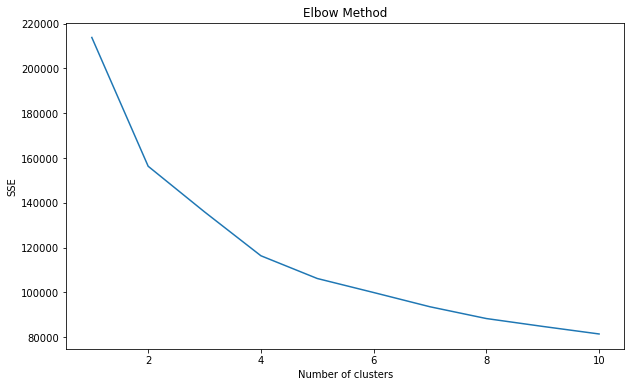

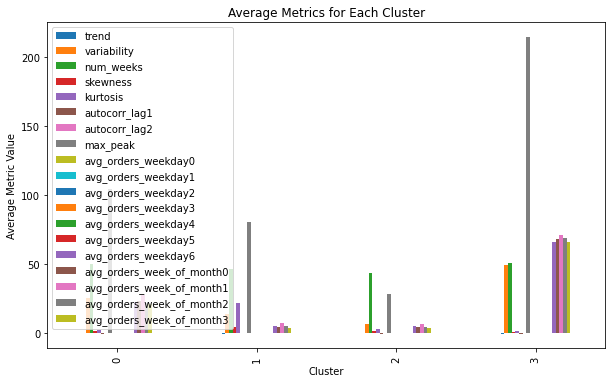

In [9]:
# Drop any rows with missing values
metrics.dropna(inplace=True)

# Normalize the metrics
metrics_normalized = (metrics - metrics.mean()) / metrics.std()

info_metrics = check_dataframe(metrics)
info_metrics_normalized = check_dataframe(metrics_normalized)

print(info_metrics)
print(info_metrics_normalized)

#Fill NaN values with 0 because all values are 0
metrics_normalized.fillna(0, inplace=True)

# Use the elbow method to find the optimal number of clusters
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(metrics_normalized)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

# Choose the number of clusters based on the elbow plot
num_clusters = 4  # replace with the number of clusters you chose

# Perform k-means clustering
kmeans = KMeans(n_clusters=num_clusters)
clusters = kmeans.fit_predict(metrics_normalized)

# Add the cluster labels to the metrics DataFrame
metrics['cluster'] = clusters

# Calculate the average metrics for each cluster
cluster_averages = metrics.groupby('cluster').mean()

# Plot the average metrics for each cluster

cluster_averages.plot(kind='bar', figsize=(10, 6))
plt.title('Average Metrics for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Metric Value')
plt.show()

In [10]:
cluster_averages

,trend,variability,num_weeks,skewness,kurtosis,autocorr_lag1,autocorr_lag2,max_peak,avg_orders_weekday0,avg_orders_weekday1,avg_orders_weekday2,avg_orders_weekday3,avg_orders_weekday4,avg_orders_weekday5,avg_orders_weekday6,avg_orders_week_of_month0,avg_orders_week_of_month1,avg_orders_week_of_month2,avg_orders_week_of_month3
cluster,,,,,,,,,,,,,,,,,,,
0,-0.044159,25.279593,50.382144,1.431427,2.436653,-0.074660,0.032828,104.731305,0.0,0.0,0.0,0.0,0.0,0.0,22.520216,23.275140,27.935812,22.178111,20.968226
1,-0.086561,13.722595,46.348948,4.448045,21.750942,-0.026905,-0.017848,80.870459,0.0,0.0,0.0,0.0,0.0,0.0,5.226473,4.689452,7.520730,5.349227,4.260954
2,-0.031932,7.075971,43.560270,1.623866,2.942557,-0.102929,-0.005893,28.202415,0.0,0.0,0.0,0.0,0.0,0.0,5.258723,4.739992,6.603606,4.418218,3.707853
3,-0.127670,49.141083,51.259434,1.005758,1.731827,-0.066000,0.035341,214.327044,0.0,0.0,0.0,0.0,0.0,0.0,66.109371,68.487421,71.173113,68.731001,66.043632


In [11]:
metrics.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15271 entries, 1 to 9999
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   trend                      15271 non-null  float64
 1   variability                15271 non-null  float64
 2   num_weeks                  15271 non-null  float64
 3   skewness                   15271 non-null  float64
 4   kurtosis                   15271 non-null  float64
 5   autocorr_lag1              15271 non-null  float64
 6   autocorr_lag2              15271 non-null  float64
 7   max_peak                   15271 non-null  float64
 8   avg_orders_weekday0        15271 non-null  float64
 9   avg_orders_weekday1        15271 non-null  float64
 10  avg_orders_weekday2        15271 non-null  float64
 11  avg_orders_weekday3        15271 non-null  float64
 12  avg_orders_weekday4        15271 non-null  float64
 13  avg_orders_weekday5        15271 non-null  float64
 

In [ ]:
metrics.to_parquet('../01data/02preprocessed/03features/01client_time_feature_cantidad_venta.parquet')

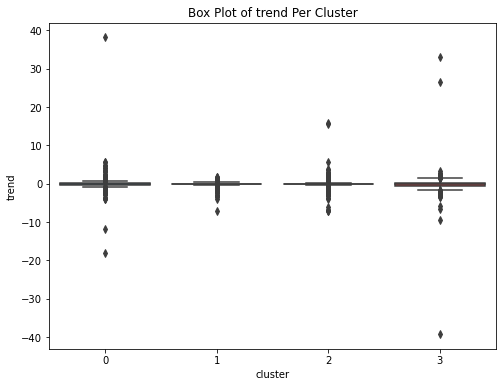

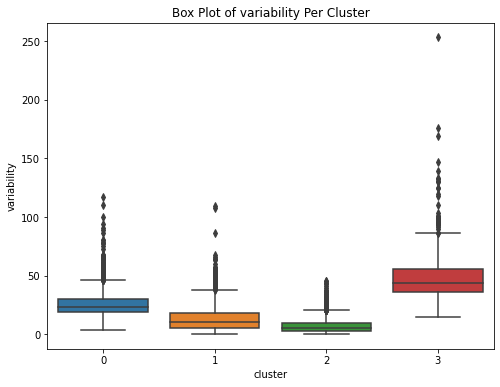

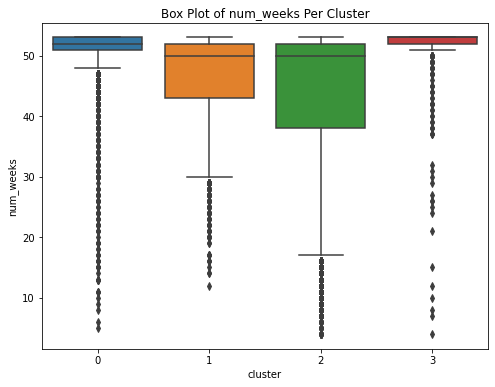

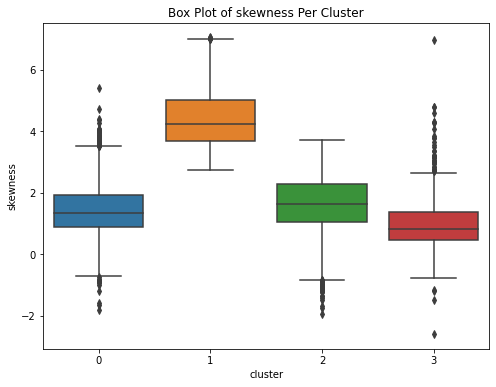

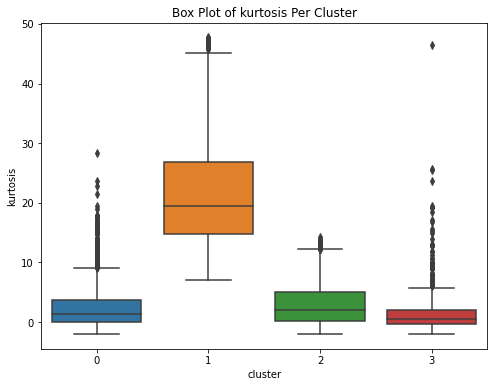

...

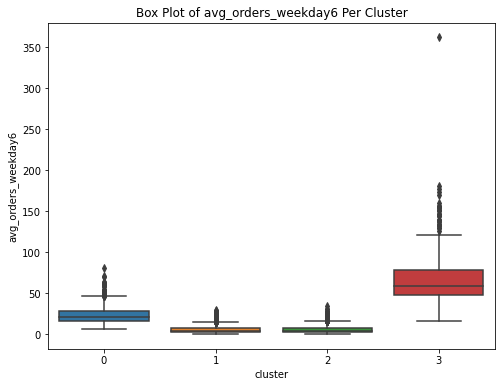

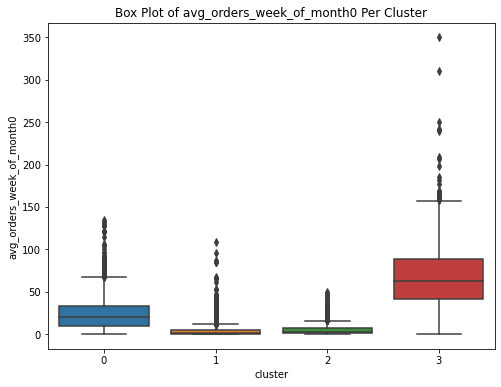

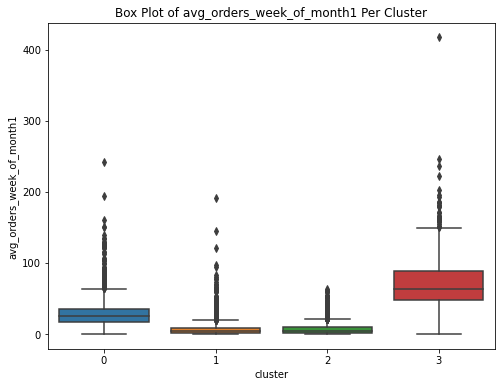

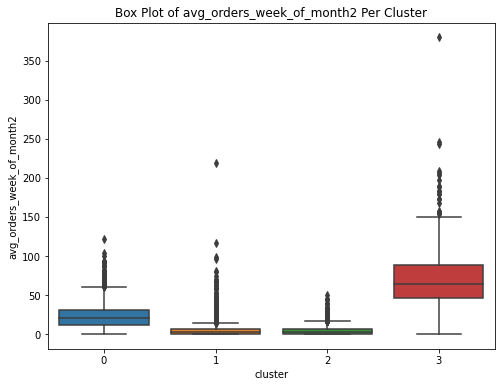

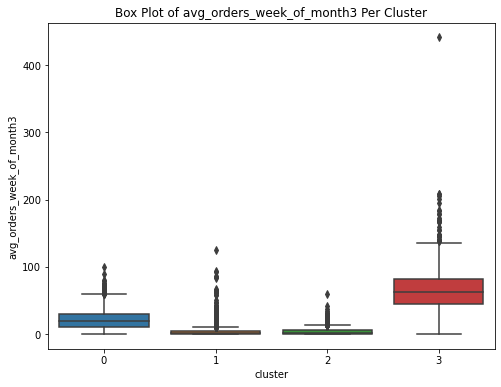

In [12]:
import seaborn as sns

def plot_boxplot_per_cluster(df, cluster_col):
    # Get the number of clusters
    num_clusters = df[cluster_col].nunique()

    # Get the columns to plot
    cols_to_plot = df.columns[df.columns != cluster_col]

    # For each column, plot a boxplot
    for col in cols_to_plot:
        # Create a new figure
        plt.figure(figsize=(8, 6))

        # Plot the boxplot for this column
        sns.boxplot(x=cluster_col, y=col, data=df)

        # Add swarmplot (points)
        #sns.swarmplot(x=cluster_col, y=col, data=df, color=".25")

        # Set the title
        plt.title(f'Box Plot of {col} Per Cluster')

        # Show the plot
        plt.show()

# Call the function
plot_boxplot_per_cluster(metrics, 'cluster')